In [1]:
import matplotlib.pyplot as plt
from matplotlib.backend_bases import RendererBase
from scipy import signal
from scipy.io import wavfile
#import soundfile as sf
import os
import numpy as np
from PIL import Image
from scipy.fftpack import fft
from pathlib import Path
import glob
import numpy as np
%matplotlib inline

In [147]:
data_dir = Path('/home/sumona/newdatawithbr/MS_15')

In [148]:
#Normal=1 #MR=2 #MS=3 #AS=4 #MVP=5
sample_audio = []
labels=[]
for filename in glob.glob(os.path.join(data_dir,'*.wav')):
    q=os.path.join(data_dir,filename)
    print(q)
    sample_audio.append(q)
    labels.append(3)
        

/home/sumona/newdatawithbr/MS_15/New_MS_15_098.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_146.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_160.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_001.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_183.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_088.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_166.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_136.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_199.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_048.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_028.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_141.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_127.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_153.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_188.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_011.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_073.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_025.wav
/home/sumona/newdatawithbr/MS_15/New_MS_15_126.wav
/home/sumona/newdatawithbr/MS_1

In [149]:
labels=np.asarray(labels)
labels.shape

(200,)

In [150]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

/home/sumona/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


(200,)

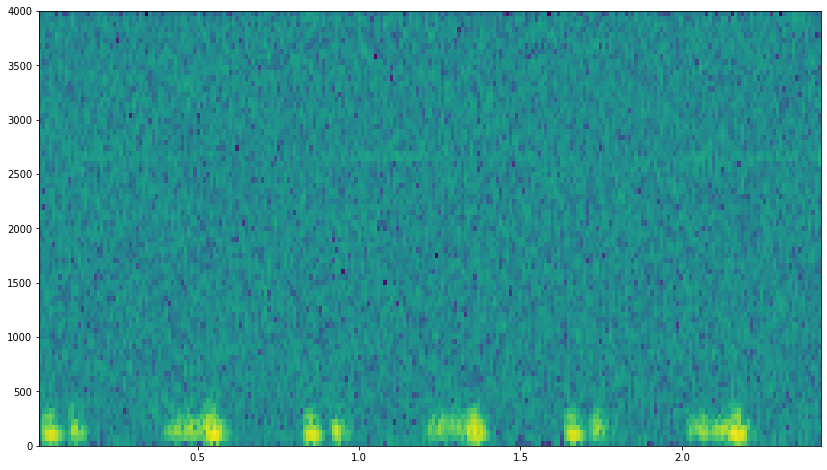

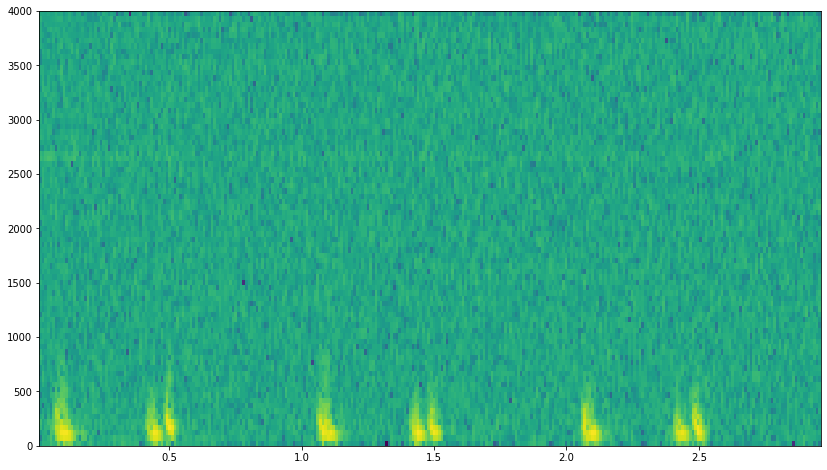

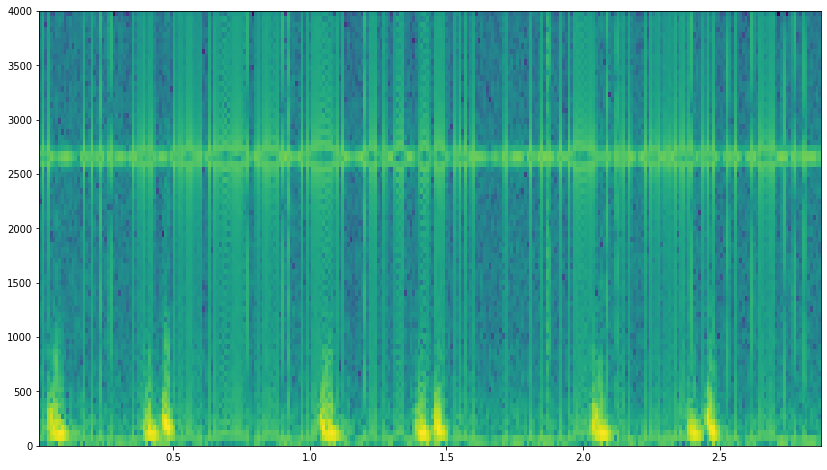

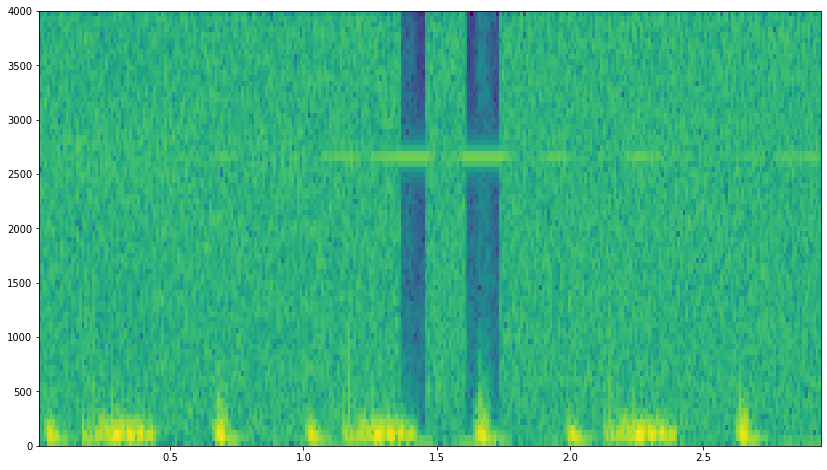

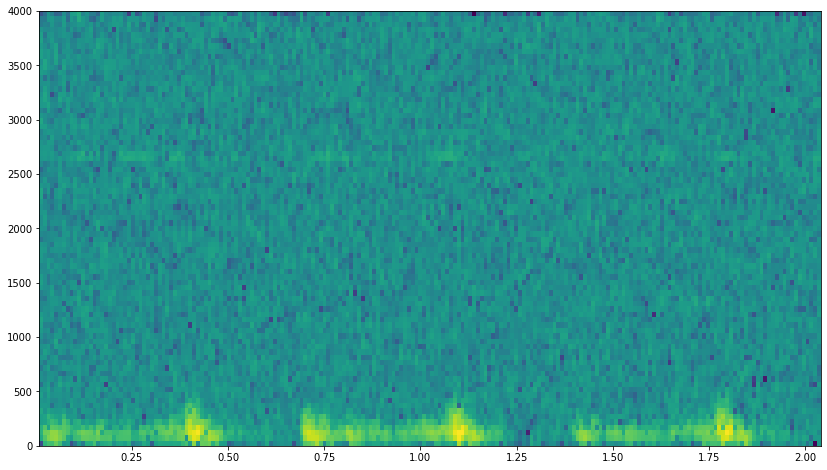

...

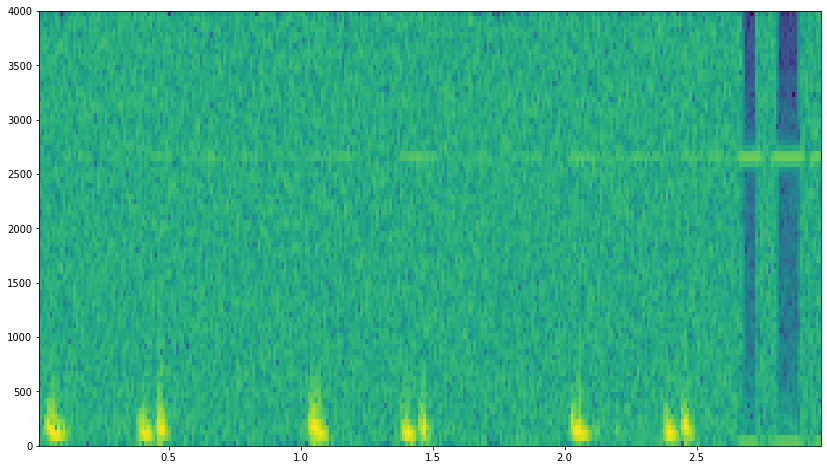

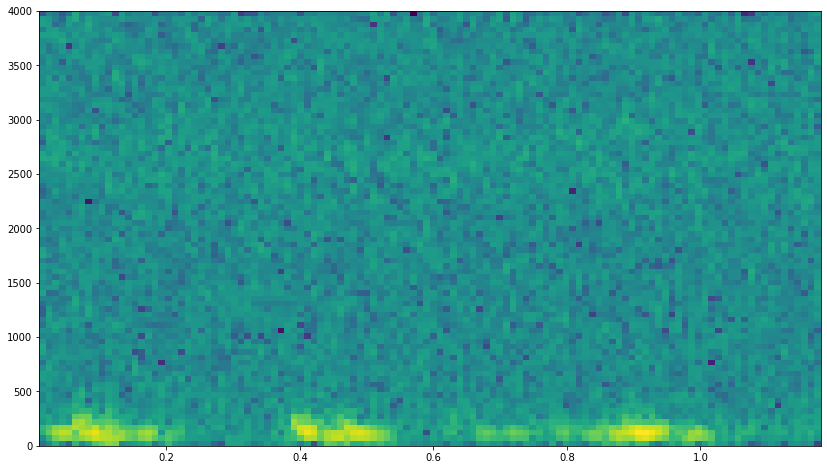

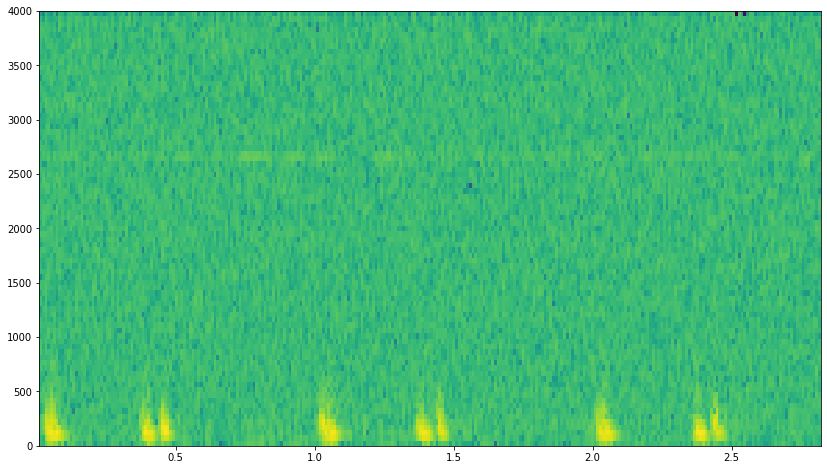

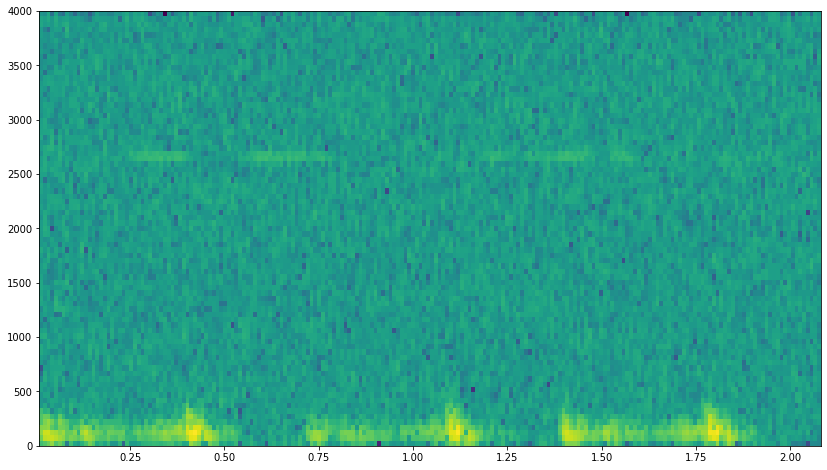

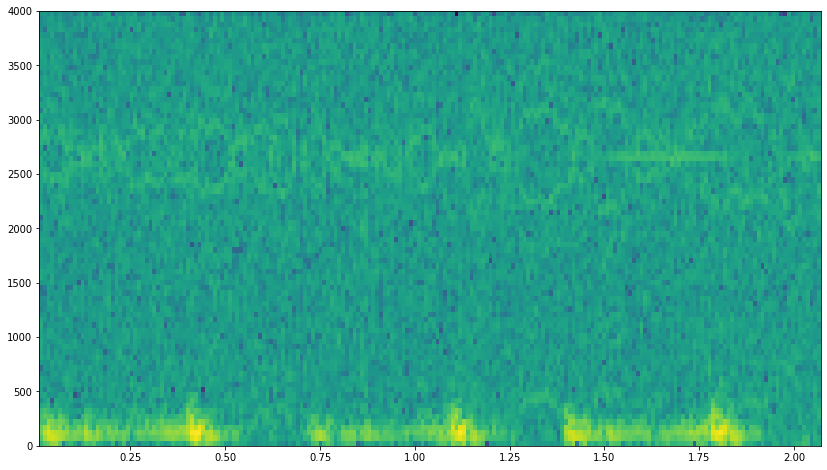

In [151]:
fig_loc=[]
spect_res=[]
for r in sample_audio:
    sample_rate, samples = wavfile.read(r)
    freqs, times, spectrogram = log_specgram(samples, sample_rate)
    spect_res.append(spectrogram)
    fig = plt.figure(figsize=(14, 8))
    plt.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
    plt.savefig(r + ".jpg")
    fig_loc.append(r +".jpg")

spect_res=np.asarray(spect_res) 
spect_res.shape

In [152]:
print(fig_loc)
fig_loc=np.asarray(fig_loc)
fig_loc.shape

['/home/sumona/newdatawithbr/MS_15/New_MS_15_098.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_146.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_160.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_001.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_183.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_088.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_166.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_136.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_199.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_048.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_028.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_141.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_127.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_153.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_188.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_011.wav.jpg', '/home/sumona/newdatawithbr/MS_15/New_MS_15_073.wav.jpg', '/home/sumona

(200,)

In [153]:
import tensorflow as tf 
from keras.applications.resnet50 import ResNet50
from keras.layers import Flatten, Input
from keras.models import Model
from keras.preprocessing import image
from keras.applications.imagenet_utils import preprocess_input
import numpy as np
from io import BytesIO
import time
import cv2


In [154]:
start = time.time()


model = ResNet50(weights='imagenet', pooling=max, include_top = False) 
model.summary()


Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_10[0][0]                   
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
___________________________________________________________________________________________

In [155]:
im=[]
spect_features=[]
for file in fig_loc:
    f = cv2.imread(file)
    im.append(f)
    img = image.load_img(file, target_size=(224, 224))
    x = image.img_to_array(img) 
    x = np.expand_dims(x, axis=0) 
    x = preprocess_input(x) 
    features = model.predict(x)
    features_reduce = features.squeeze()
    features_flatten = features_reduce.reshape((features.shape[0], 7 * 7 * 2048))
    spect_features.append(features_flatten)

In [156]:
spect_features=np.asarray(spect_features)
spect_features=spect_features.reshape(200,100352)
spect_features.shape

(200, 100352)

In [157]:
from numpy import savetxt
savetxt('spectrogram_MS_15.csv',spect_features)
savetxt('labels_MS_15.csv',labels)

In [158]:
from numpy import loadtxt
data = loadtxt('spectrogram_MS_15.csv')
data.shape

(200, 100352)

In [159]:
labels=loadtxt('labels_MS_15.csv')
print(labels)

[3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3.]
